#**Brain Tumor Detection and Localization Using YOLO v12 and Deep Learning Techniques in Python**

In [ ]:
# check for GPU availability
!nvidia-smi

Tue Feb 25 11:22:36 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   70C    P8             11W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [ ]:
import torch
torch.cuda.empty_cache()


#**Step 01 # Install the Ultralytics Package**

In [ ]:
# install ultralytics
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 921.5/921.5 kB 21.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 109.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 15.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 47.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 11.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 7.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 67.5 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstal

#**Step 02 # Import All the Requried Libraries**

In [ ]:
# import libraries
import ultralytics
ultralytics.checks()
from ultralytics import YOLO
from IPython.display import Image

Ultralytics 8.3.78 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 33.2/112.6 GB disk)


#**Step # 03 Download Dataset from Roboflow**

In [ ]:
# load the dataset
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="0zA9553LIS7TIrJO3Cr4")
project = rf.workspace("aykut-izfoo").project("brain-tumor-detection-rwfby")
version = project.version(3)
dataset = version.download("yolov11")



   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 83.1/83.1 kB 3.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 7.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 11.6 MB/s eta 0:00:00
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.11.0.86
    Uninstalling opencv-python-headless-4.11.0.86:
      Successfully uninstalled opencv-python-headless-4.11.0.86
  Attempting uninstall: idna
    Found existing installation: idna 3.10
    Uninstalling idna-3.10:
      Successfully uninstalled idna-3.10


loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Brain-Tumor-Detection-3 in yolov11:: 100%|██████████| 3012/3012 [00:00<00:00, 6129.11it/s]


In [ ]:
# check for base directory
dataset.location

'/content/Brain-Tumor-Detection-3'

#**Step # 04 Train YOLOv12 Model on a Custom Dataset**

In [ ]:
!yolo task=detect mode=train data={dataset.location}/data.yaml model="yolo11m.pt" epochs=20 imgsz=640 batch=8 amp=False

100% 38.8M/38.8M [00:00<00:00, 97.2MB/s]
Ultralytics 8.3.78 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolo11m.pt, data=/content/Brain-Tumor-Detection-3/data.yaml, epochs=20, time=None, patience=100, batch=8, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=False, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save

### **Summary**  

- **Training**: Completed 20 epochs in **0.668 hours**.  
- **Model Details**: YOLOv11m with **125 layers**, **20M parameters**, and **67.6 GFLOPs**.  
- **Performance Metrics**:  
  - **mAP@50**: **92.1%**  
  - **mAP@50-95**: **55.2%**  
  - **Precision**: **91.4%**  
  - **Recall**: **87.4%**  
- **Speed**:  
  - **Inference time**: **24.9ms per image**  
  - **Preprocessing**: **0.4ms**  
  - **Postprocessing**: **3.4ms**  
- **Output Saved**: `runs/detect/train/weights/`  
- **Optimizer Removed**: Model weights (`best.pt` & `last.pt`) stripped to **40.5MB**.

#**Step # 05 Examine Training Results**

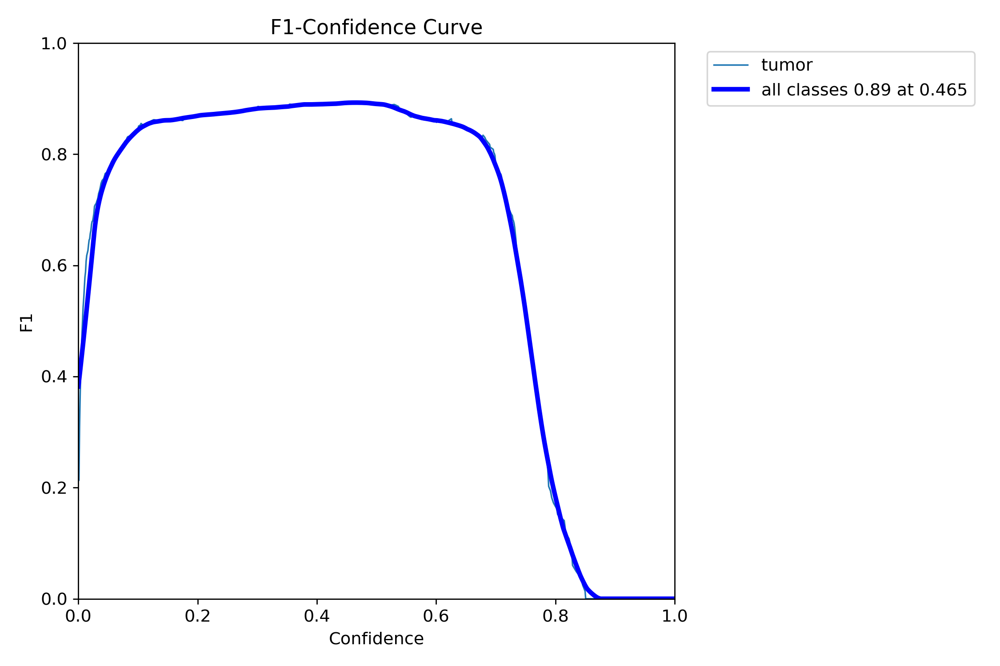

In [ ]:
Image("/content/runs/detect/train/F1_curve.png", width=600)

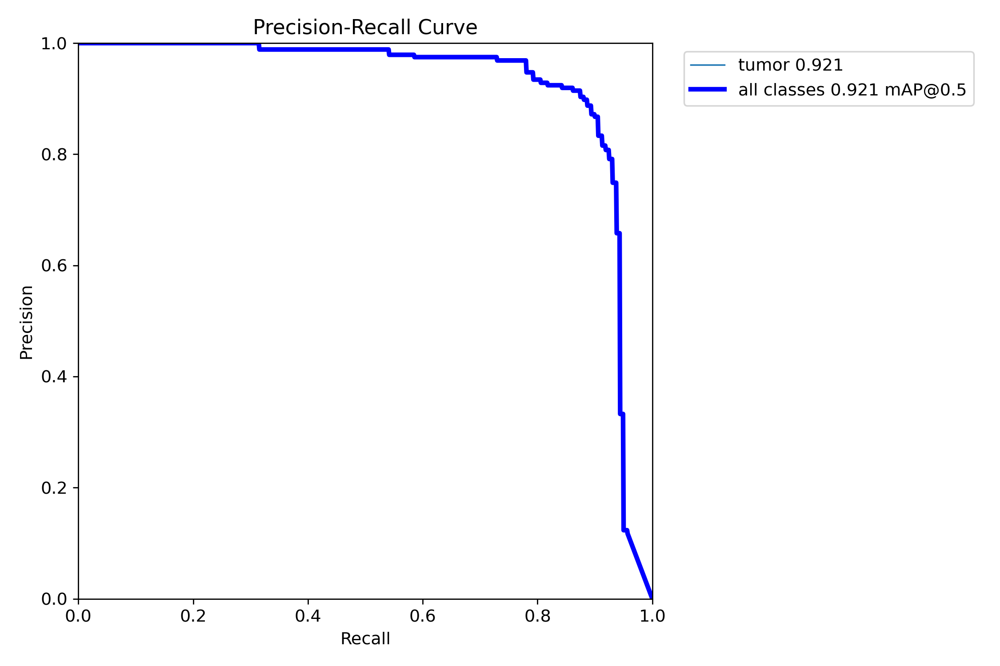

In [ ]:
Image("/content/runs/detect/train/PR_curve.png", width=600)

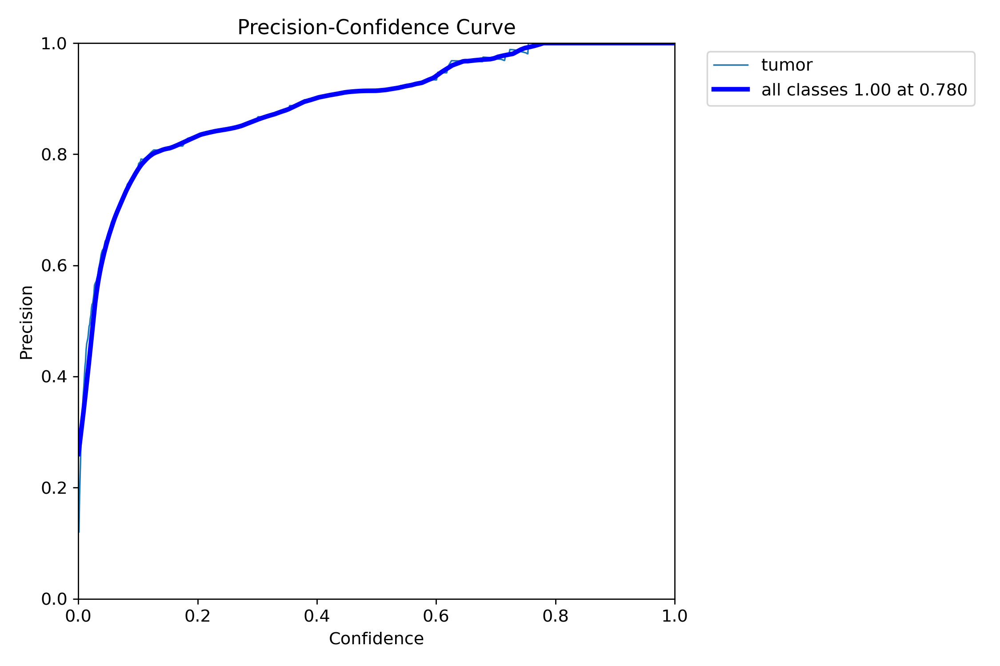

In [ ]:
Image("/content/runs/detect/train/P_curve.png", width=600)

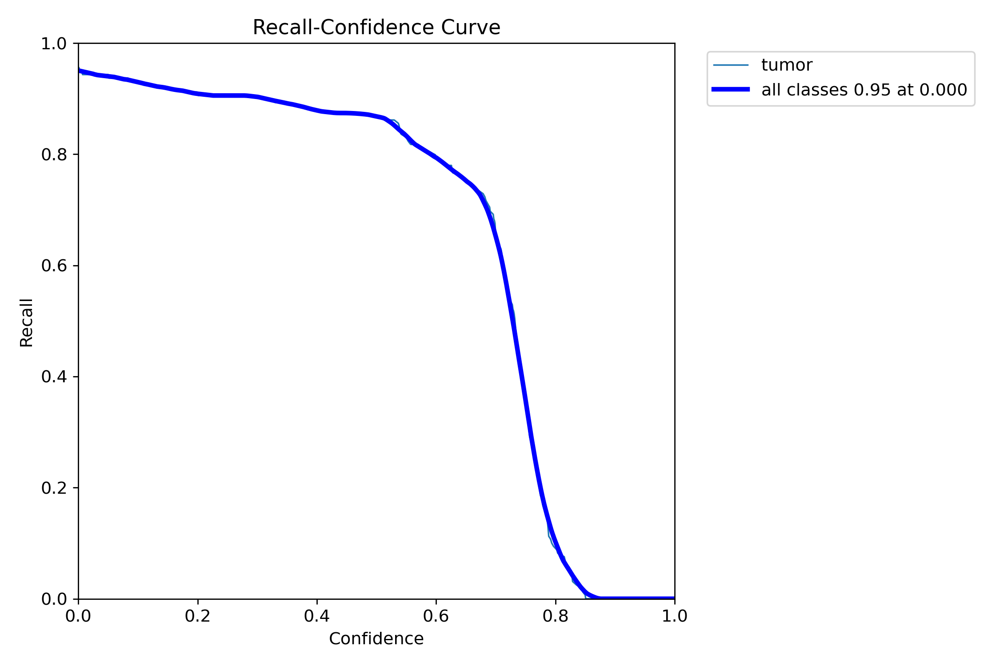

In [ ]:
Image("/content/runs/detect/train/R_curve.png", width=600)

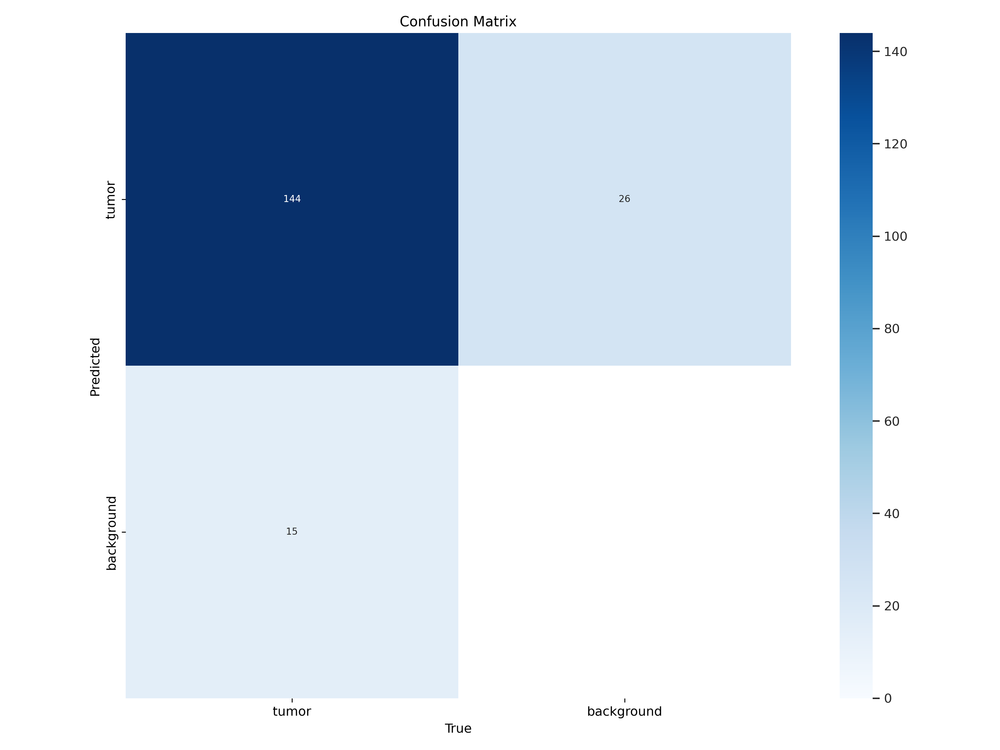

In [ ]:
Image("/content/runs/detect/train/confusion_matrix.png", width=600)

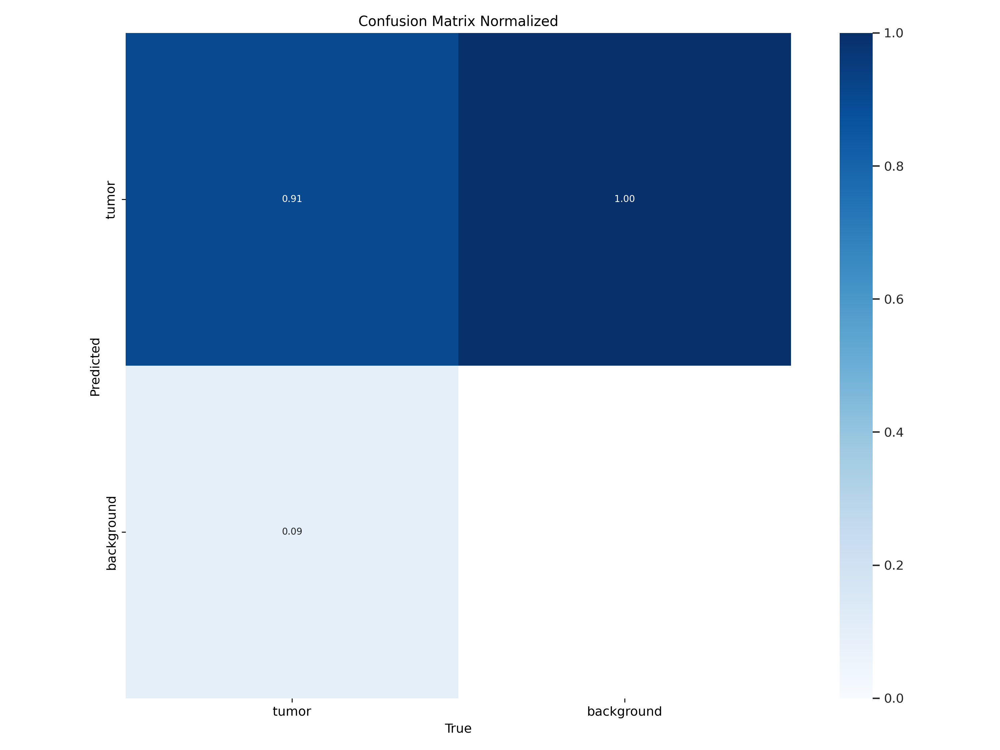

In [ ]:
Image("/content/runs/detect/train/confusion_matrix_normalized.png", width=600)

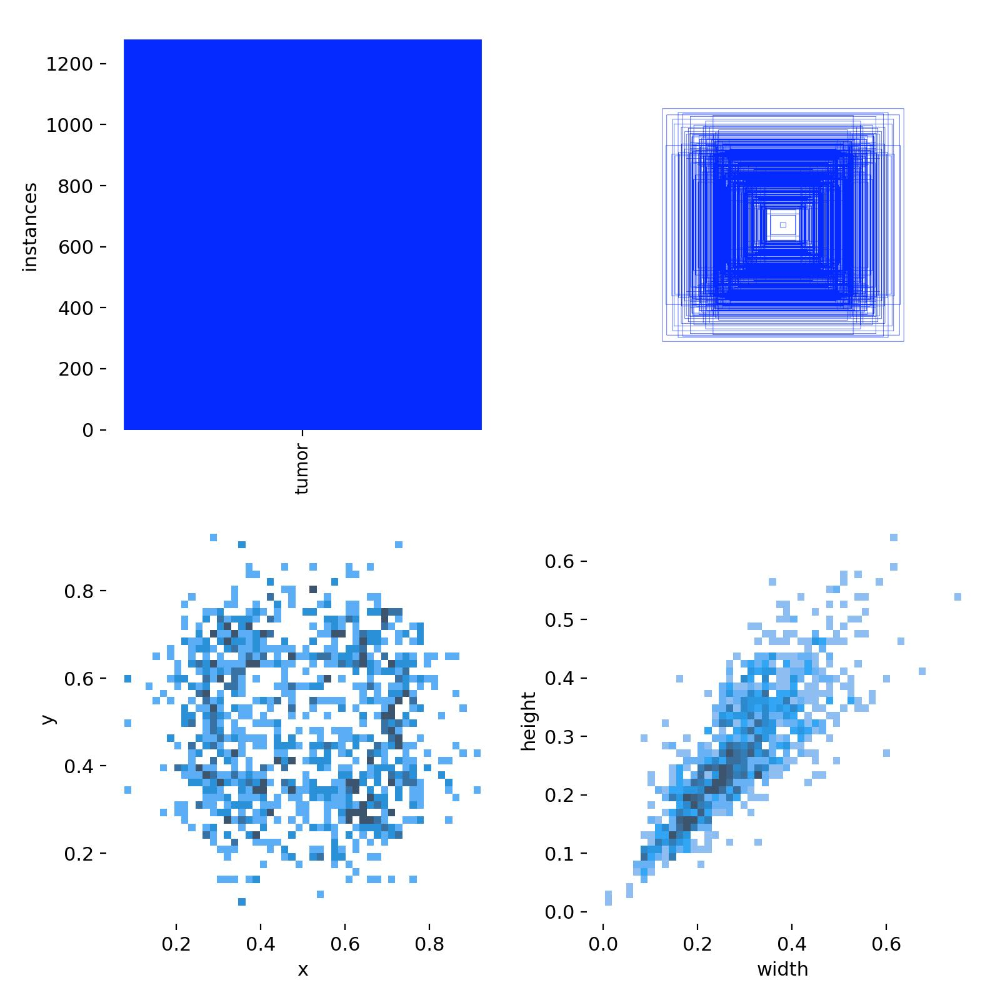

In [ ]:
Image("/content/runs/detect/train/labels.jpg", width=600)

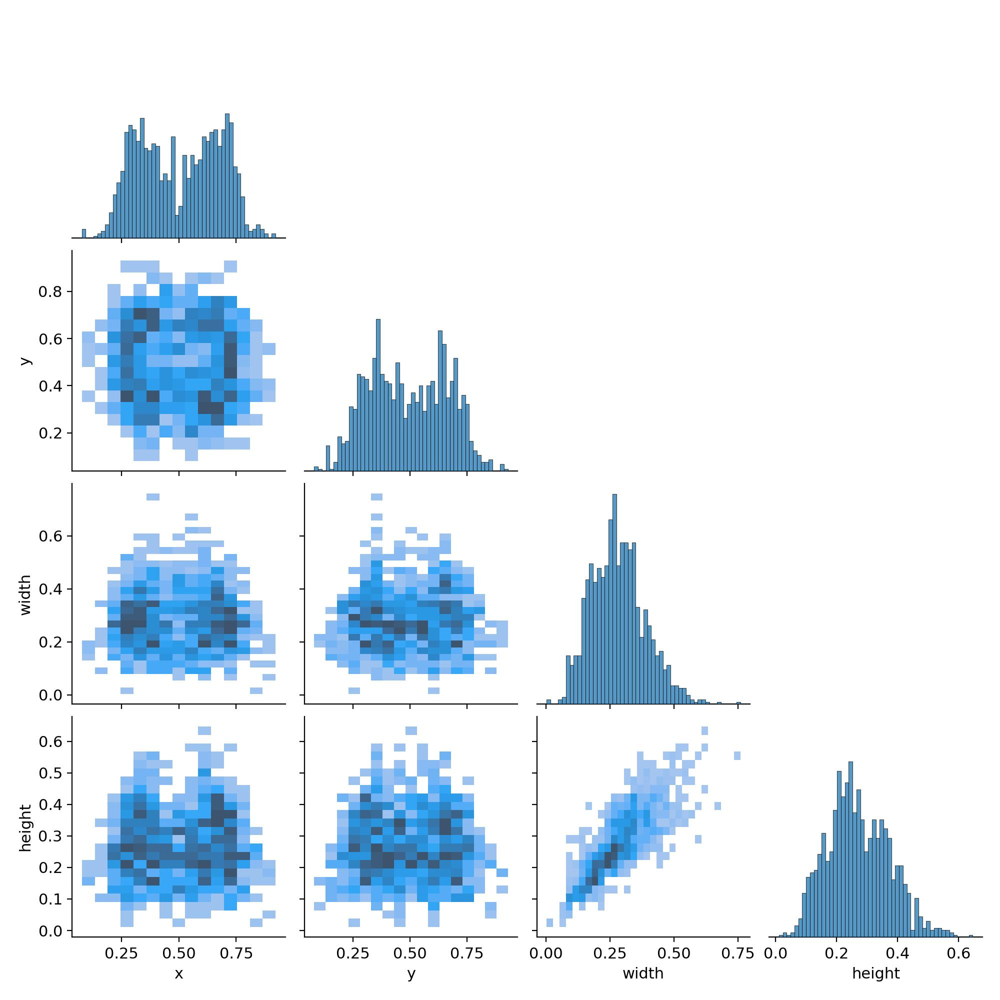

In [ ]:
Image("/content/runs/detect/train/labels_correlogram.jpg", width=600)

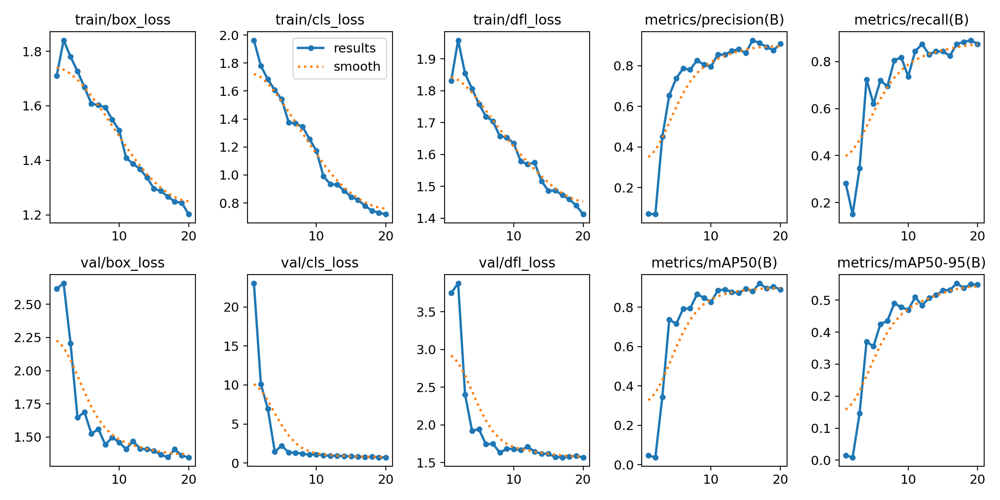

In [ ]:
Image("/content/runs/detect/train/results.png", width=600)

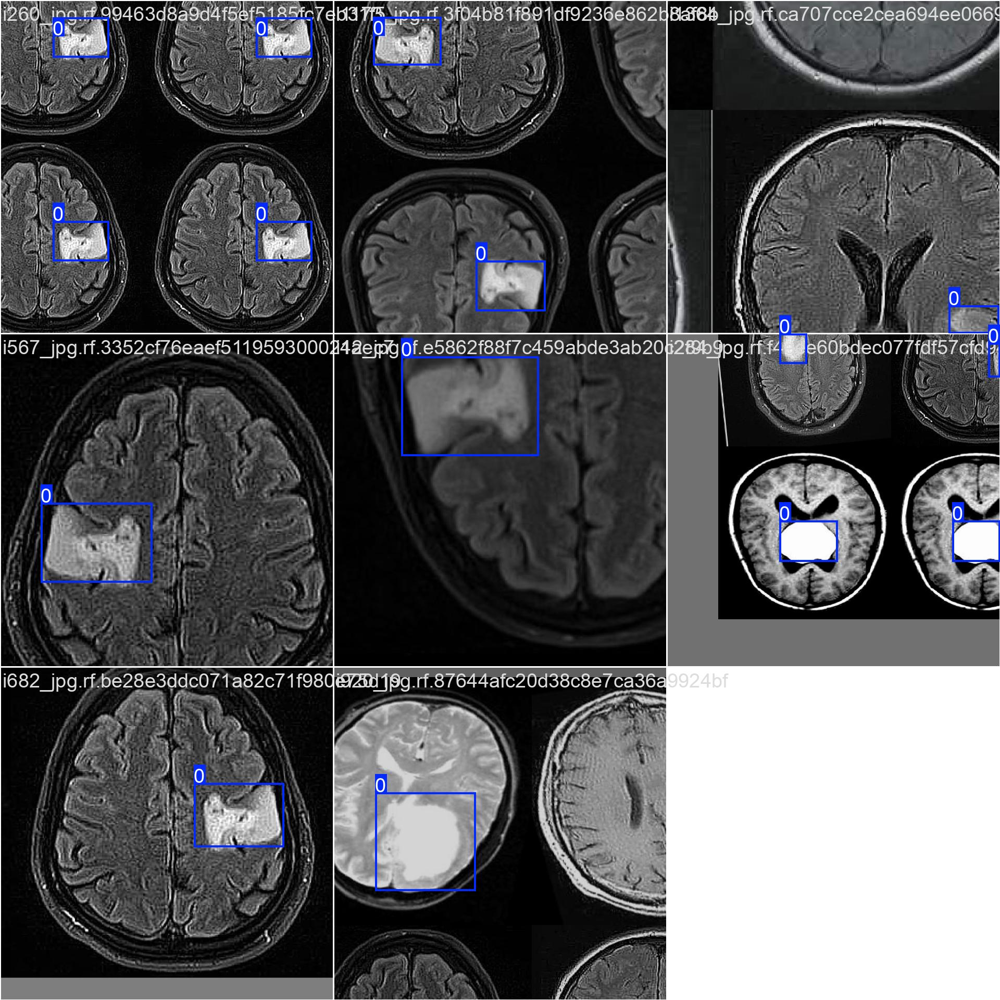

In [ ]:
Image("/content/runs/detect/train/train_batch0.jpg", width=600)

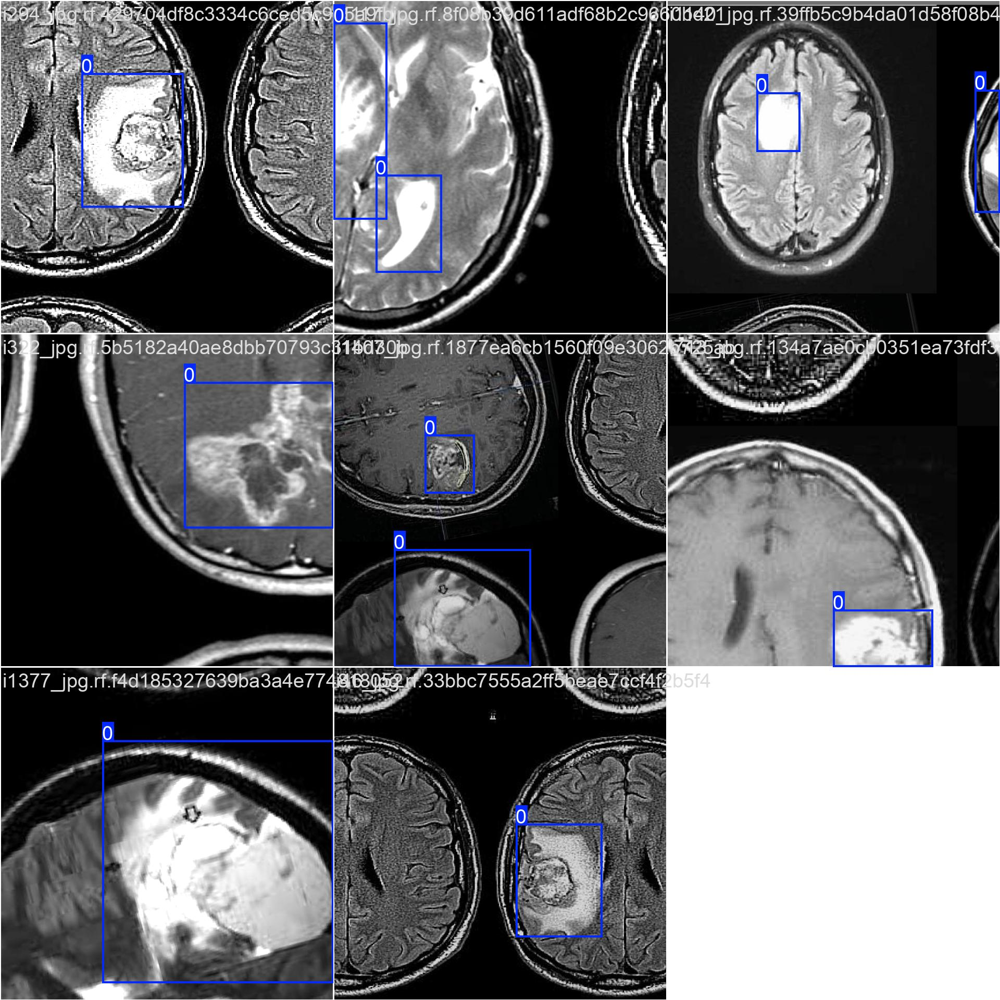

In [ ]:
Image("/content/runs/detect/train/train_batch1.jpg", width=600)

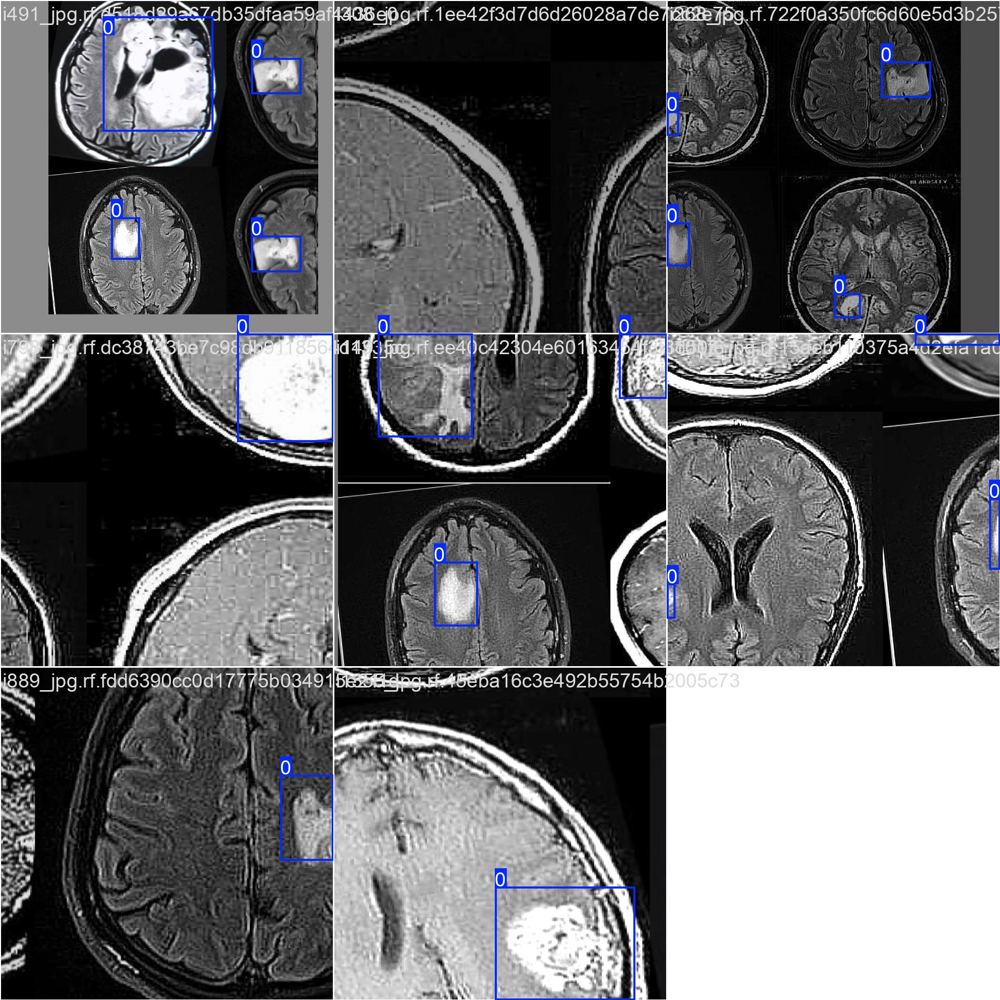

In [ ]:
Image("/content/runs/detect/train/train_batch2.jpg", width=600)

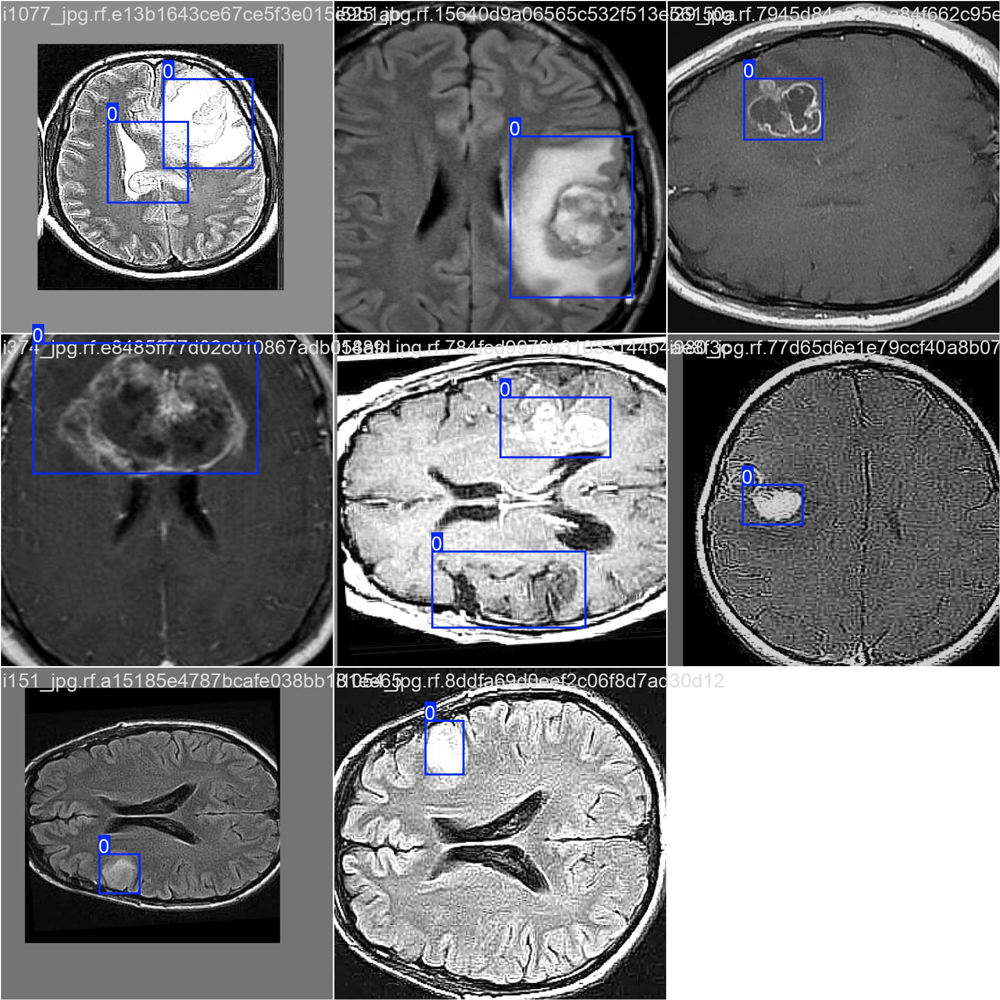

In [ ]:
Image("/content/runs/detect/train/train_batch1500.jpg", width=600)


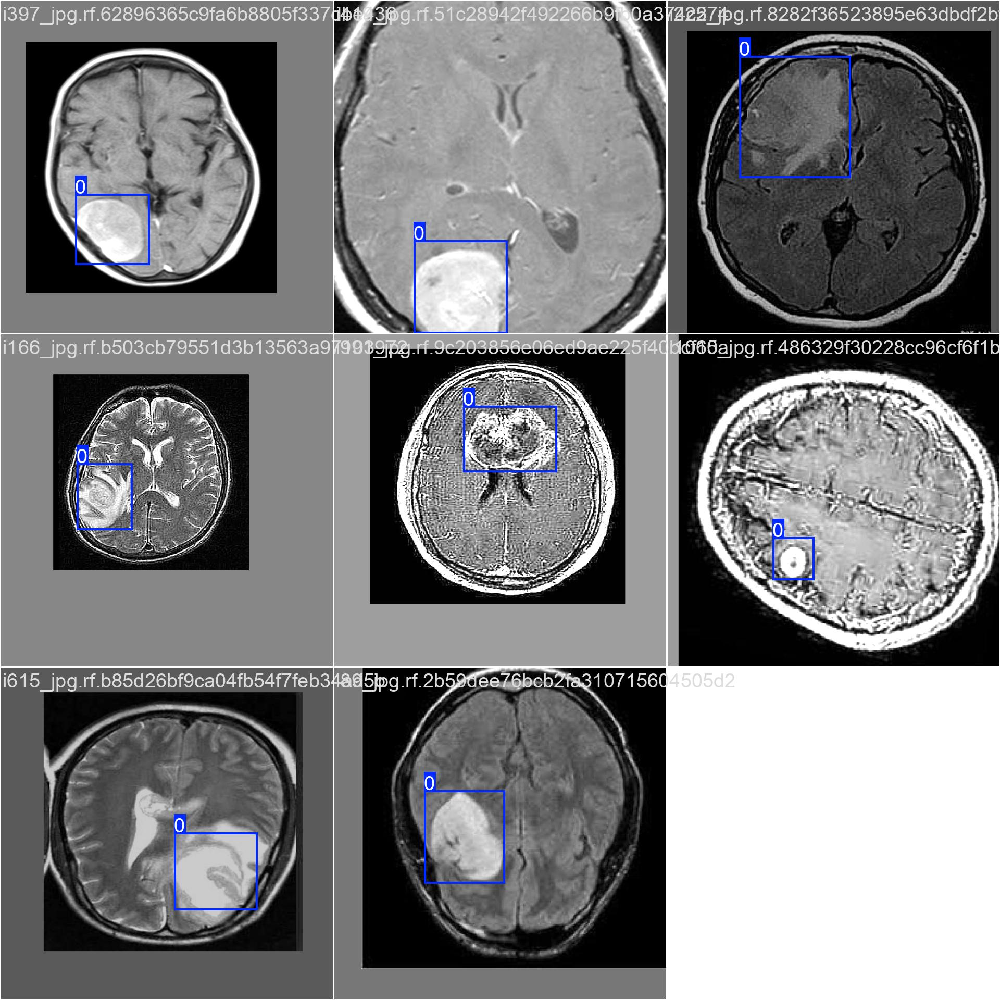

In [ ]:
Image("/content/runs/detect/train/train_batch1501.jpg", width=600)

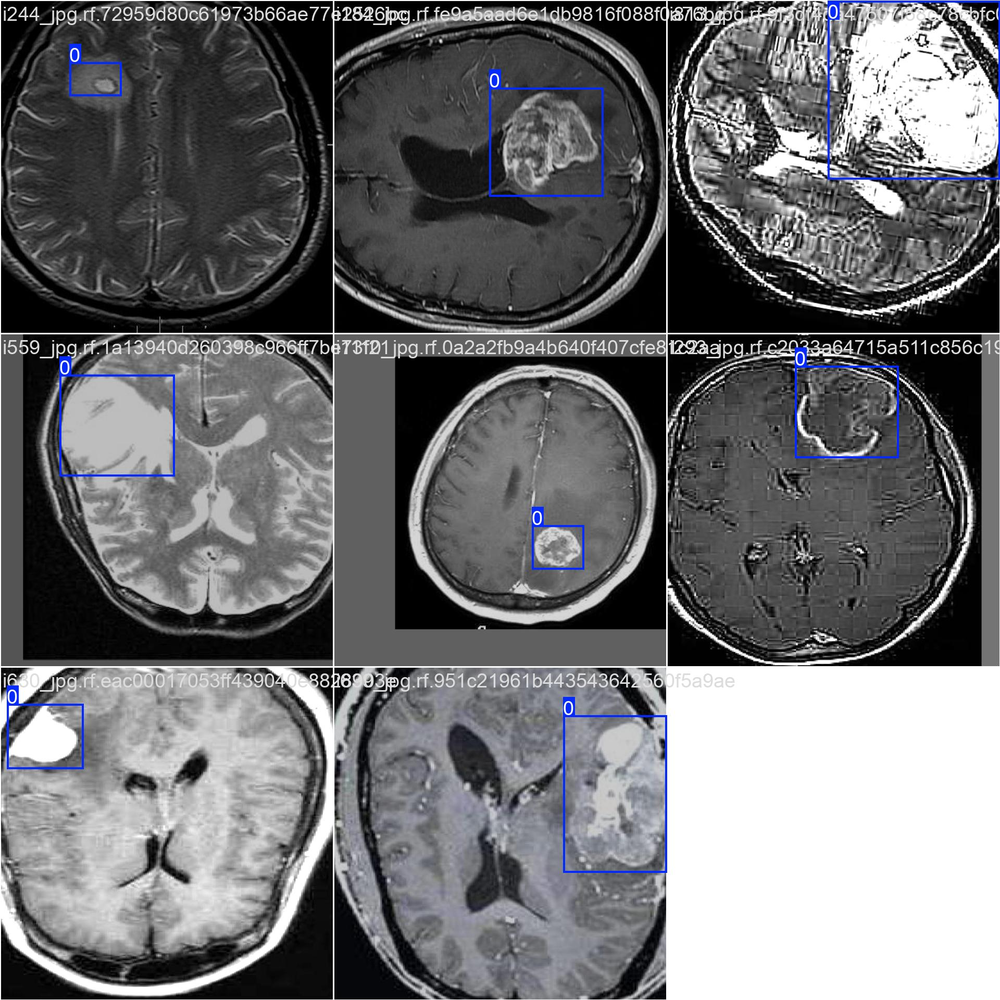

In [ ]:
Image("/content/runs/detect/train/train_batch1502.jpg", width=600)

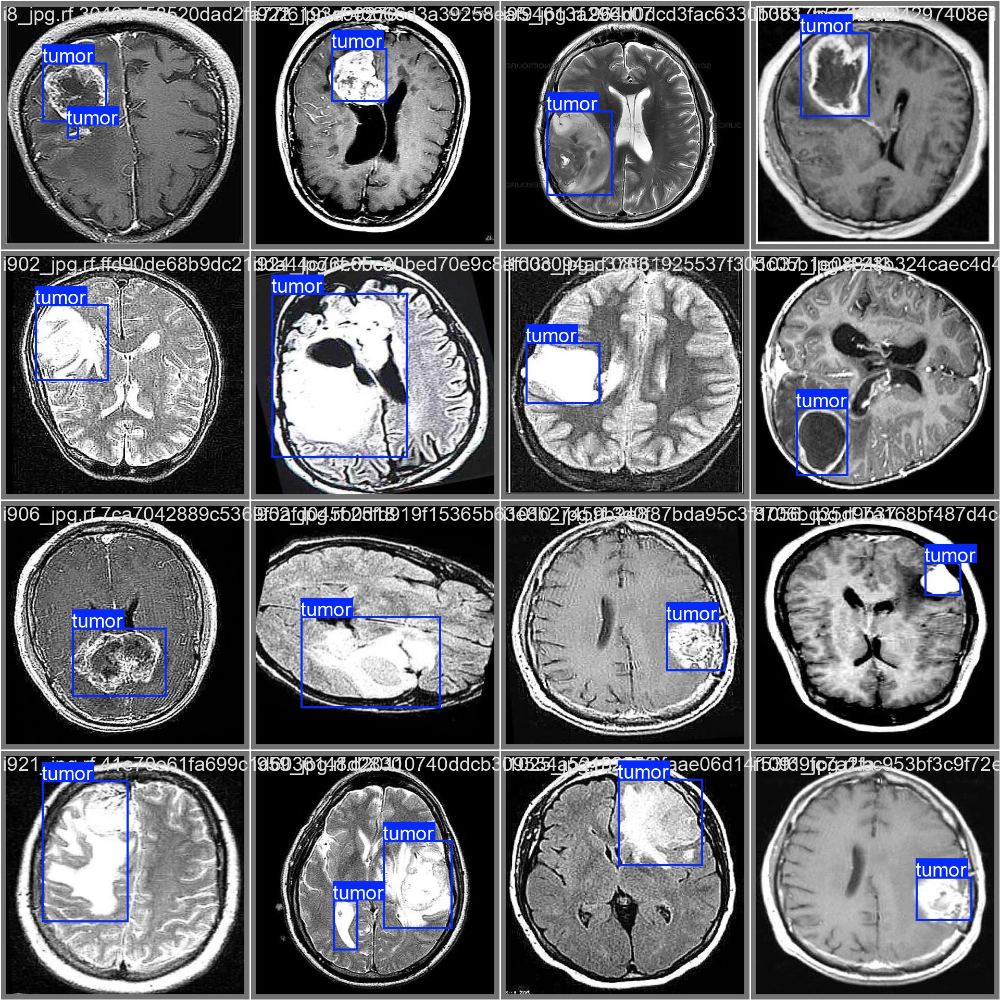

In [ ]:
Image("/content/runs/detect/train/val_batch0_labels.jpg", width=600)

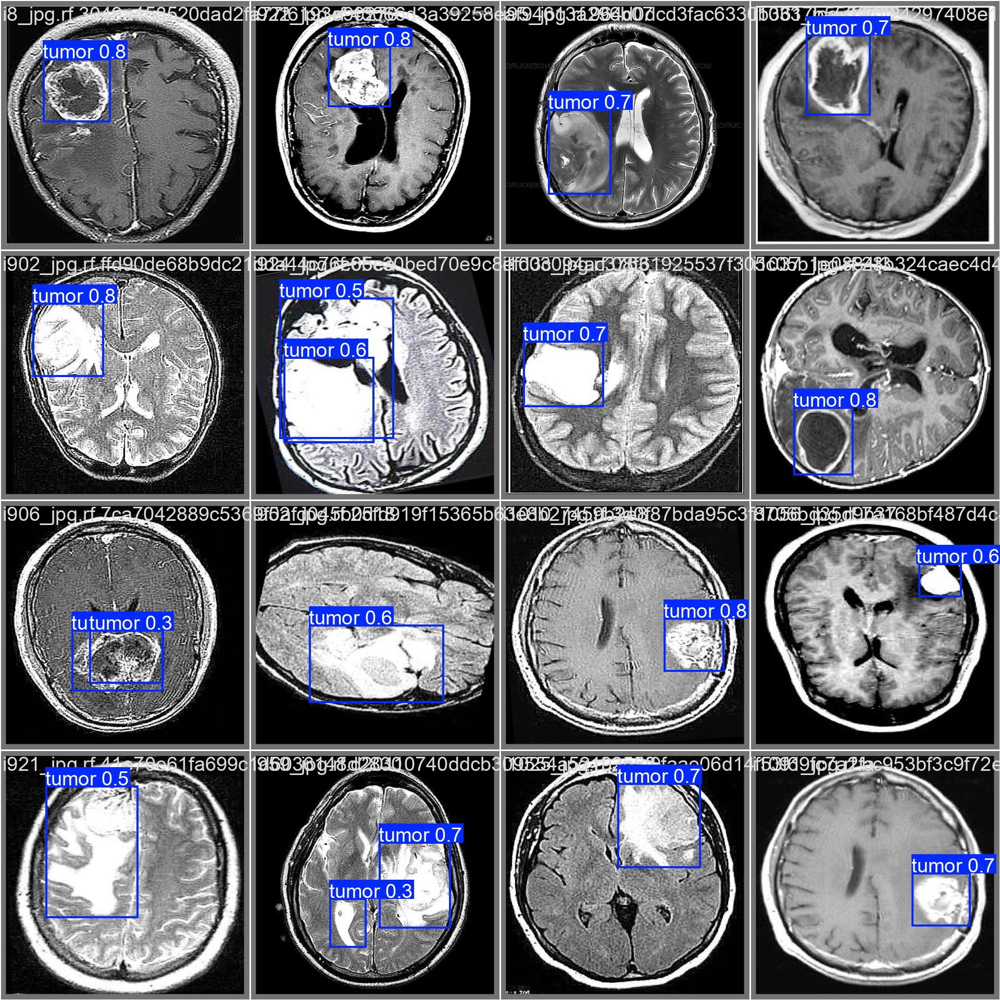

In [ ]:
Image("/content/runs/detect/train/val_batch0_pred.jpg", width=600)

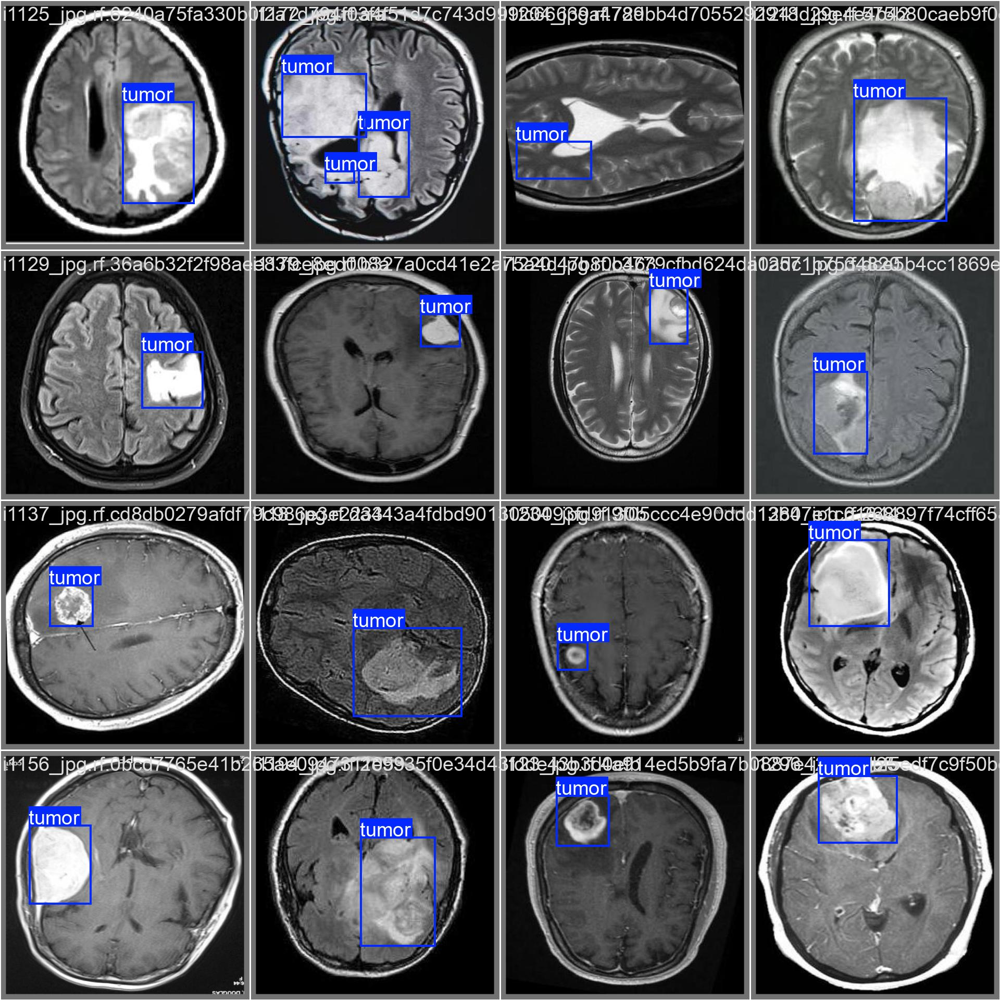

In [ ]:
Image("/content/runs/detect/train/val_batch1_labels.jpg", width=600)

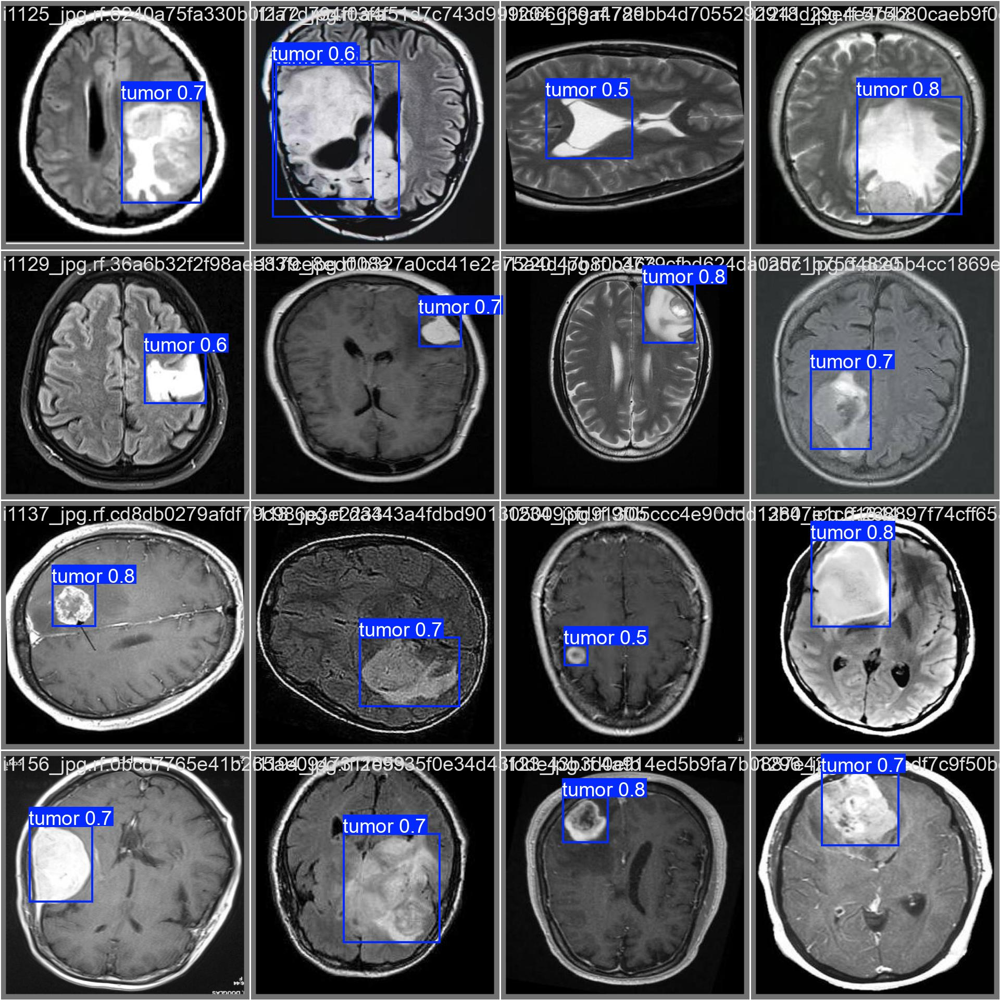

In [ ]:
Image("/content/runs/detect/train/val_batch1_pred.jpg", width=600)

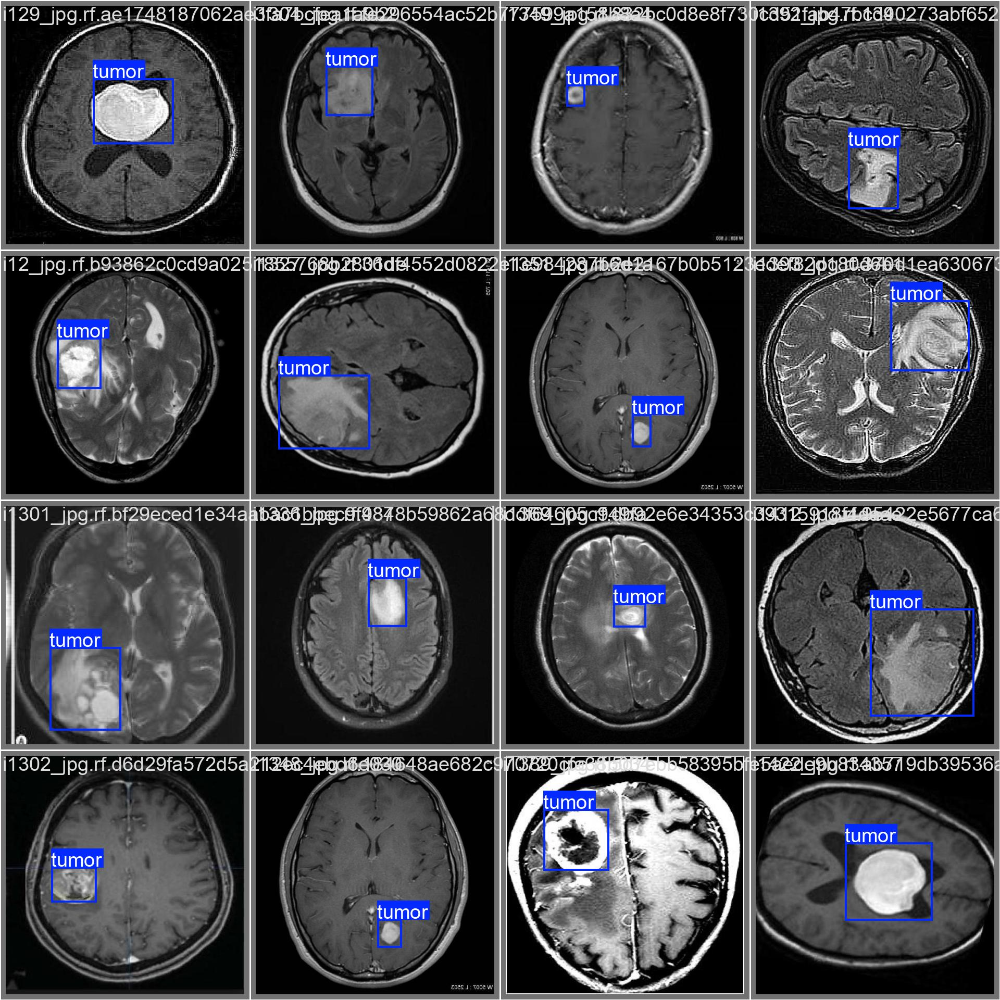

In [ ]:
Image("/content/runs/detect/train/val_batch2_labels.jpg", width=600)

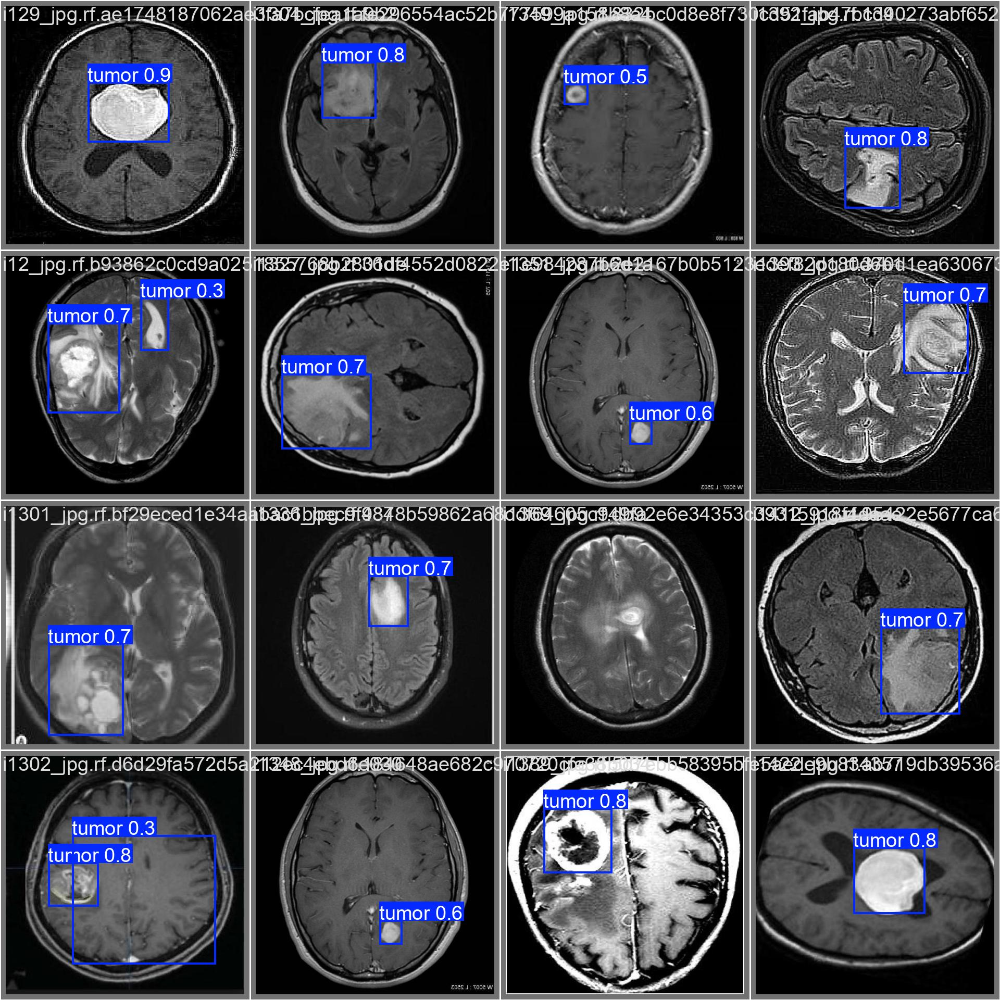

In [ ]:
Image("/content/runs/detect/train/val_batch2_pred.jpg", width=600)

#**Step # 06  Validate Fine-Tuned Model**

In [ ]:
!yolo task=detect mode=val model="/content/runs/detect/train/weights/last.pt" data={dataset.location}/data.yaml

Ultralytics 8.3.78 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11m summary (fused): 125 layers, 20,030,803 parameters, 0 gradients, 67.6 GFLOPs
val: Scanning /content/Brain-Tumor-Detection-3/valid/labels.cache... 150 images, 0 backgrounds, 0 corrupt: 100% 150/150 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 10/10 [00:05<00:00,  1.81it/s]
                   all        150        159      0.908      0.874       0.89      0.549
Speed: 4.2ms preprocess, 23.7ms inference, 0.0ms loss, 2.0ms postprocess per image
Results saved to runs/detect/val
💡 Learn more at https://docs.ultralytics.com/modes/val


### **Validation Summary**  

- **Model**: YOLOv11m (Ultralytics 8.3.78)  
- **Hardware**: Tesla T4 (CUDA)  
- **Dataset**: **150 images**, **159 instances**, **no corrupt data**  
- **Performance Metrics**:  
  - **mAP@50**: **89.0%**  
  - **mAP@50-95**: **54.9%**  
  - **Precision**: **90.8%**  
  - **Recall**: **87.4%**  
- **Speed**:  
  - **Inference**: **25.5ms per image**  
  - **Preprocessing**: **0.3ms**  
  - **Postprocessing**: **2.5ms**  
- **Results Saved**: `runs/detect/val/`

#**Step # 07 Inference with Custom Model on Images**

In [ ]:
!yolo task=detect mode=predict model="/content/runs/detect/train/weights/best.pt" conf=0.25 source={dataset.location}/test/images save=True

Ultralytics 8.3.78 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11m summary (fused): 125 layers, 20,030,803 parameters, 0 gradients, 67.6 GFLOPs

image 1/150 /content/Brain-Tumor-Detection-3/test/images/i1019_jpg.rf.e4808ddd7241a10b8bb3ff450c33536f.jpg: 640x640 2 tumors, 36.9ms
image 2/150 /content/Brain-Tumor-Detection-3/test/images/i101_jpg.rf.5b56ca83ecaa37f38eb9d7c7c489d5d3.jpg: 640x640 (no detections), 36.9ms
image 3/150 /content/Brain-Tumor-Detection-3/test/images/i1044_jpg.rf.f25459e240def28a790f923702c67937.jpg: 640x640 1 tumor, 36.8ms
image 4/150 /content/Brain-Tumor-Detection-3/test/images/i1047_jpg.rf.320443d07a03675362504e55a35fcab3.jpg: 640x640 1 tumor, 36.8ms
image 5/150 /content/Brain-Tumor-Detection-3/test/images/i1053_jpg.rf.dffe4352e344bcbe2bbe854f479816fb.jpg: 640x640 1 tumor, 36.8ms
image 6/150 /content/Brain-Tumor-Detection-3/test/images/i1057_jpg.rf.3c943f59cb6e5f653ab5120c5505a866.jpg: 640x640 1 tumor, 36.8ms
image 7/150 /content/Brain-Tumor

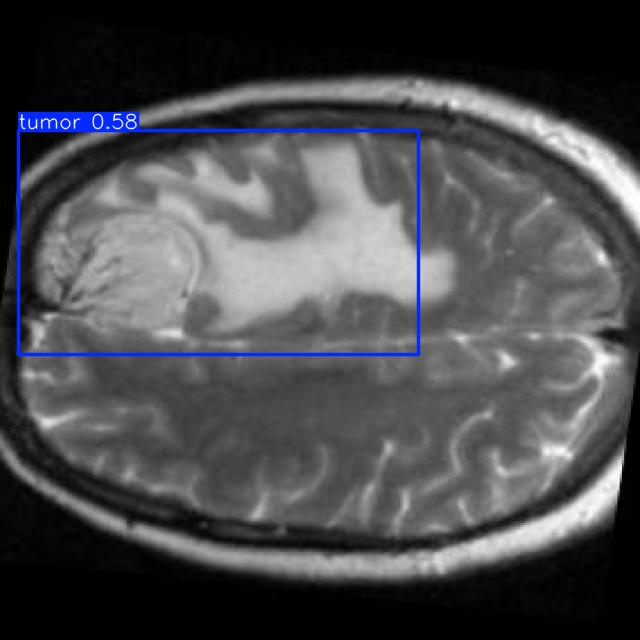

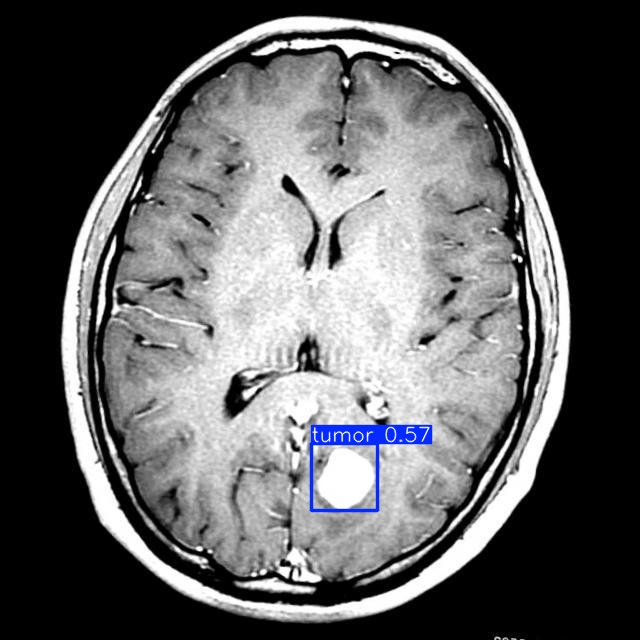

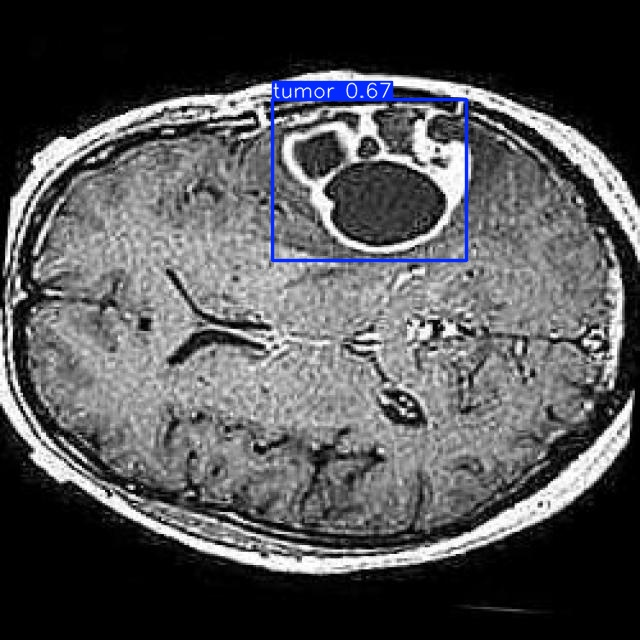

In [ ]:
import glob
import os
from IPython.display import Image as IPyImage, display

latest_folder = max(glob.glob('/content/runs/detect/predict*/'), key=os.path.getmtime)
for img in glob.glob(f'{latest_folder}/*.jpg')[1:4]:
    display(IPyImage(filename=img, width=600))
    print("\n")

In [ ]:
# convert  model to torchscript
model = YOLO("/content/runs/detect/train/weights/best.pt")
model.export(format="torchscript")


Ultralytics 8.3.78 🚀 Python-3.11.11 torch-2.5.1+cu124 CPU (Intel Xeon 2.00GHz)
YOLO11m summary (fused): 125 layers, 20,030,803 parameters, 0 gradients, 67.6 GFLOPs

PyTorch: starting from '/content/runs/detect/train/weights/best.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) (1, 5, 8400) (38.6 MB)

TorchScript: starting export with torch 2.5.1+cu124...
TorchScript: export success ✅ 7.4s, saved as '/content/runs/detect/train/weights/best.torchscript' (77.1 MB)

Export complete (10.9s)
Results saved to /content/runs/detect/train/weights
Predict:         yolo predict task=detect model=/content/runs/detect/train/weights/best.torchscript imgsz=640  
Validate:        yolo val task=detect model=/content/runs/detect/train/weights/best.torchscript imgsz=640 data=/content/Brain-Tumor-Detection-3/data.yaml  
Visualize:       https://netron.app


'/content/runs/detect/train/weights/best.torchscript'

Loading /content/runs/detect/train/weights/best.torchscript for TorchScript inference...

0: 640x640 2 tumors, 36.7ms
Speed: 2.7ms preprocess, 36.7ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)
Tumor detected!


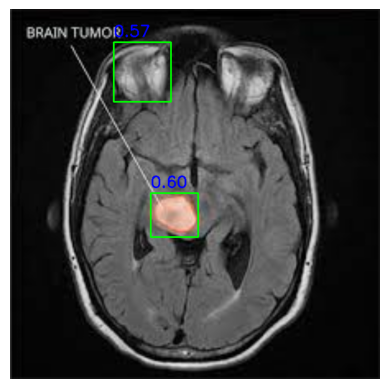

In [ ]:
import cv2
import torch
import matplotlib.pyplot as plt
from ultralytics import YOLO

def predict_and_display_v11(image_path, model_path, confidence_threshold=0.5, target_size=(640, 640)):
    """
    Detects and visualizes brain tumor presence in an image using a fine-tuned YOLOv11 model.
    Enhances the image by resizing and converting it to grayscale before prediction.

    Args:
        image_path: Path to the input image.
        model_path: Path to the trained YOLOv11 TorchScript model.
        confidence_threshold: Minimum confidence score for a detection to be considered.
        target_size: The target size for resizing the image.
    """
    # Load and preprocess the image
    img = cv2.imread(image_path)
    img_resized = cv2.resize(img, target_size)
    img_gray = cv2.cvtColor(img_resized, cv2.COLOR_BGR2GRAY)
    img_gray_bgr = cv2.cvtColor(img_gray, cv2.COLOR_GRAY2BGR)  # Convert back to 3-channel

    # Load the YOLOv11 model (TorchScript format)
    model = YOLO(model_path)

    # Perform inference
    results = model.predict(source=img_gray_bgr, conf=confidence_threshold)

    # Process detections
    detections = results[0].boxes.data.tolist()

    # Check if any tumor is detected
    if detections:
        print("Tumor detected!")
        for *xyxy, conf, cls in detections:
            xmin, ymin, xmax, ymax = map(int, xyxy)
            cv2.rectangle(img_resized, (xmin, ymin), (xmax, ymax), (0, 255, 0), 2)  # Bounding box
            cv2.putText(img_resized, f"{conf:.2f}", (xmin, ymin - 10),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255, 0, 0), 2)
    else:
        print("No tumor detected.")

    # Display the processed image
    img_rgb = cv2.cvtColor(img_resized, cv2.COLOR_BGR2RGB)
    plt.imshow(img_rgb)
    plt.axis('off')  # Hide axes
    plt.show()

    return detections

# Example usage
detections = predict_and_display_v11(
    image_path="/content/drive/MyDrive/Colab Notebooks/assets/3.jpeg",
    model_path="/content/runs/detect/train/weights/best.torchscript"
)


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive
